In [1]:
import pandas as pd
data = pd.read_csv("/home/ubuntu/x_full_cilia_filter_rf_n10000_phylo_jaccard.csv")

data.columns

Index(['Unnamed: 0', 'scGPT_bc_embeddings_similarities',
       'scGPT_pancancer_embeddings_similarities',
       'scGPT_CP_embeddings_similarities',
       'scGPT_lung_embeddings_similarities',
       'scGPT_heart_embeddings_similarities',
       'scGPT_brain_embeddings_similarities',
       'scGPT_kidney_embeddings_similarities',
       'scGPT_human_embeddings_similarities', 'GF-6L30M_HUMANemb_similarities',
       'GF-20L95M_HUMANemb_similarities', 'GF-12L95M_HUMANemb_similarities',
       'GF-12L95MCANCER_UNIPROT_HUMANemb_similarities',
       'GF-12L30M_HUMANemb_similarities', 'Correlation', 'Same_Complex',
       'GeneAB', 'Random Forest_n10000 predictions',
       'Random Forest_n10000 probabilities', 'Gene_A', 'Gene_B',
       'Phylogenetic_Jaccard_Similarity'],
      dtype='object')

In [39]:
df = data[['Gene_A', 'Gene_B', 'Phylogenetic_Jaccard_Similarity', 'Random Forest_n10000 probabilities', 'Same_Complex']]

In [40]:
df

,Gene_A,Gene_B,Phylogenetic_Jaccard_Similarity,Random Forest_n10000 probabilities,Same_Complex
0,PTPDC1,PRKACA,0.494505,0.0936,0
1,PTPDC1,RAB1A,0.471154,0.0479,0
2,PTPDC1,DZIP1,0.491228,0.0465,0
3,PTPDC1,EHD1,0.475610,0.0263,0
4,PTPDC1,NME8,0.500000,0.0109,0
...,...,...,...,...,...
59023,NGFR,MAK,0.212500,0.0139,0
59024,NGFR,PKD1,0.608696,0.0507,0
59025,ARL2,SMO,0.250000,0.0975,0
59026,TMEM231,MAK,0.412500,0.0958,0


In [41]:
from scipy.stats import zscore

df['prob_z'] = zscore(df['Random Forest_n10000 probabilities'])
df['jaccard_z'] = zscore(df['Phylogenetic_Jaccard_Similarity'])
df['composite_score'] = df['prob_z'] + df['jaccard_z']  # Or weighted sum here too
df_sorted = df.sort_values(by='composite_score', ascending=False)

/tmp/ipykernel_4520/1240941819.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['prob_z'] = zscore(df['Random Forest_n10000 probabilities'])
/tmp/ipykernel_4520/1240941819.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['jaccard_z'] = zscore(df['Phylogenetic_Jaccard_Similarity'])
/tmp/ipykernel_4520/1240941819.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documenta

In [43]:
df_sorted.to_csv('cilia_rf_n10000_phylo_composite.csv',index=False)

In [46]:
def get_top_gene_partners(df, top_n=5):
    # Make sure columns are named as expected
    assert {"Gene_A", "Gene_B", "composite_score"}.issubset(df.columns)

    # Duplicate the dataframe to treat Gene_A and Gene_B symmetrically
    df_a = df[["Gene_A", "Gene_B", "composite_score"]].rename(columns={"Gene_A": "Gene", "Gene_B": "Partner"})
    df_b = df[["Gene_B", "Gene_A", "composite_score"]].rename(columns={"Gene_B": "Gene", "Gene_A": "Partner"})
    combined = pd.concat([df_a, df_b], axis=0)
    #display(combined)

    # # Group by Gene and get top N partners by score
    top_partners = (
        combined.sort_values(by=["Gene", "composite_score"], ascending=[True, False])
        .groupby("Gene")
        .head(top_n)
    )

    #print(top_partners)

    # Build final output
    def format_row(group):
        partners = group["Partner"].tolist()
        scores = group["composite_score"].tolist()
        row = {"Gene": group["Gene"].iloc[0]}
        for i in range(top_n):
            row[f"Top_{i+1}"] = partners[i] if i < len(partners) else None
            row[f"Score_{i+1}"] = scores[i] if i < len(scores) else None
        return pd.Series(row)

    result = top_partners.groupby("Gene").apply(format_row).reset_index(drop=True)[['Gene', 'Top_1', 'Top_2', 'Top_3', 'Top_4', 'Top_5', 'Score_1', 'Score_2',  'Score_3', 'Score_4', 'Score_5']]
    return result


In [47]:
df = pd.read_csv('cilia_rf_n10000_phylo_composite.csv')

In [48]:
top_gene_partners = get_top_gene_partners(df).sort_values(by = 'Score_1', ascending=False)

/tmp/ipykernel_133532/2634278445.py:30: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  result = top_partners.groupby("Gene").apply(format_row).reset_index(drop=True)[['Gene', 'Top_1', 'Top_2', 'Top_3', 'Top_4', 'Top_5', 'Score_1', 'Score_2',  'Score_3', 'Score_4', 'Score_5']]


In [49]:
top_gene_partners

,Gene,Top_1,Top_2,Top_3,Top_4,Top_5,Score_1,Score_2,Score_3,Score_4,Score_5
235,RAN,HSPA8,TUBA1C,ACTR3,RANBP1,RAB11A,9.238973,8.633664,7.271485,7.009451,6.989994
125,HSPA8,RAN,TUBA1A,RANBP1,ACTR3,ARF4,9.238973,8.307611,4.505740,4.109750,4.058449
230,RAB1A,RAB11A,ATP6V1D,TRAPPC3,RAB10,ARF4,8.747728,8.598499,7.357083,6.790013,6.449047
225,RAB11A,RAB1A,ATP6V1D,RAN,RAB10,GSK3B,8.747728,7.102969,6.989994,6.671057,6.560259
315,TUBA1C,RAN,MAPRE1,PLK1,ACTR3,TUBA4A,8.633664,7.917663,7.689455,6.550776,5.949861
...,...,...,...,...,...,...,...,...,...,...,...
213,PKHD1,DCDC2,EVC,HNF1B,RP1,RP1,1.332452,0.502020,0.256532,0.178759,0.165389
90,DRD2,NUP35,DRD1,PDZD7,SPA17,PKD2L1,1.317617,1.255802,1.175847,1.149323,1.148477
329,UMOD,RP1,SCNN1A,SPA17,HNF1B,IQCB1,1.258720,1.016848,0.986603,0.949167,0.847123
177,NGFR,MAL,BBIP1,ALMS1,NIN,PKD1,1.256635,1.111570,0.874923,0.705810,0.683308


In [27]:
cil = pd.read_csv('/home/ubuntu/TEST/gene_embedding_analysis/sorted_ciliary_candidates.csv')

In [28]:
cil.columns

Index(['Unnamed: 0', 'scGPT_bc_embeddings_similarities',
       'scGPT_pancancer_embeddings_similarities',
       'scGPT_CP_embeddings_similarities',
       'scGPT_lung_embeddings_similarities',
       'scGPT_heart_embeddings_similarities',
       'scGPT_brain_embeddings_similarities',
       'scGPT_kidney_embeddings_similarities',
       'scGPT_human_embeddings_similarities', 'GF-6L30M_HUMANemb_similarities',
       'GF-20L95M_HUMANemb_similarities', 'GF-12L95M_HUMANemb_similarities',
       'GF-12L95MCANCER_UNIPROT_HUMANemb_similarities',
       'GF-12L30M_HUMANemb_similarities', 'Correlation', 'Same_Complex',
       'GeneAB', 'Random Forest_n10000 predictions',
       'Random Forest_n10000 probabilities', 'Gene_A', 'Gene_B',
       'Phylogenetic_Jaccard_Similarity', 'prob_z', 'jaccard_z',
       'composite_score'],
      dtype='object')

In [29]:
cil

,Unnamed: 0,scGPT_bc_embeddings_similarities,scGPT_pancancer_embeddings_similarities,scGPT_CP_embeddings_similarities,scGPT_lung_embeddings_similarities,scGPT_heart_embeddings_similarities,scGPT_brain_embeddings_similarities,scGPT_kidney_embeddings_similarities,scGPT_human_embeddings_similarities,GF-6L30M_HUMANemb_similarities,...,Same_Complex,GeneAB,Random Forest_n10000 predictions,Random Forest_n10000 probabilities,Gene_A,Gene_B,Phylogenetic_Jaccard_Similarity,prob_z,jaccard_z,composite_score
0,5564,0.299562,0.412327,0.471062,0.337597,0.282670,0.487552,0.239592,0.470685,0.185125,...,0,HSPA8_RAN,1,0.9994,HSPA8,RAN,0.961538,3.185018,2.650819,5.835836
1,6449,0.179470,0.273478,0.296578,0.123937,0.160430,0.229799,0.094691,0.296660,0.100829,...,0,RAB11A_RAB1A,1,0.9536,RAB11A,RAB1A,0.932039,2.779582,2.483209,5.262791
2,10134,0.141153,0.209414,0.279732,0.200757,0.124941,0.208816,0.129079,0.280195,0.081894,...,0,ATP6V1D_RAB1A,1,0.9390,ATP6V1D,RAB1A,0.923810,2.650339,2.436452,5.086791
3,24435,0.154274,0.298422,0.306896,0.305914,0.190617,0.157341,0.206566,0.307085,0.122677,...,0,RAN_TUBA1C,1,0.9269,RAN,TUBA1C,0.942308,2.543226,2.541554,5.084780
4,7711,0.287291,0.540907,0.358458,0.295835,0.208702,0.184168,0.159231,0.358244,0.253609,...,0,ACTR2_ACTR3,1,0.9348,ACTR2,ACTR3,0.918605,2.613159,2.406879,5.020039
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1803,26425,0.099783,0.123511,0.156556,0.076377,0.009787,0.192663,0.013692,0.157616,0.192474,...,0,TRAPPC3_RILPL2,1,0.5339,TRAPPC3,RILPL2,0.144330,-0.935728,-1.992357,-2.928085
1804,10460,0.116613,0.065226,0.236014,0.107602,0.077370,0.234718,0.054103,0.236623,0.314287,...,0,CRB3_IFT22,1,0.5366,CRB3,IFT22,0.134615,-0.911827,-2.047553,-2.959379
1805,18118,0.135146,0.135206,0.134681,-0.002009,0.037466,0.115332,-0.009053,0.135417,0.223994,...,0,BBIP1_IFT52,1,0.5067,BBIP1,IFT52,0.176471,-1.176510,-1.809742,-2.986252
1806,26274,0.128238,0.278757,0.171353,0.000227,-0.018963,0.173583,-0.022354,0.172658,0.388234,...,0,TUBGCP3_KIAA0586,1,0.5144,TUBGCP3,KIAA0586,0.129032,-1.108348,-2.079275,-3.187622


In [30]:
get_top_gene_partners(cil)

,Gene,Top_1,Top_2,Top_3,Top_4,Top_5,Score_1,Score_2,Score_3,Score_4,Score_5
0,ABLIM1,PARD3,EXOC4,TTC17,RFX3,PCM1,1.292753,1.058962,0.942233,0.437734,-0.278478
1,ACTR2,ACTR3,RAB10,RAB14,DPYSL2,RAB11A,5.020039,3.389249,2.151630,2.109428,1.785302
2,ACTR3,ACTR2,MAPRE1,RAB10,RAN,RAB14,5.020039,4.431751,4.357792,3.729698,3.051302
3,ADCY10,OCRL,None,None,None,None,-1.214056,NaN,NaN,NaN,NaN
4,ADCY3,CCSAP,None,None,None,None,-2.204136,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...
279,WDR19,IFT88,EFHC1,IFT81,NME7,DYNC2H1,2.397659,1.117709,0.684602,0.434652,0.338103
280,WDR35,BBS5,SPEF2,CCDC40,TMEM67,IFT80,2.528334,1.698534,1.430506,1.109417,1.068625
281,XPNPEP3,C2CD3,IFT122,CLUAP1,TUBGCP5,DNAL1,1.129150,0.566058,0.492346,0.393147,-0.322476
282,ZMYND10,RSPH9,SPAG6,DNALI1,RSPH1,EFHC1,4.153354,4.108398,3.992950,3.756890,2.231167


In [32]:
pos = pd.read_csv('/home/ubuntu/positive_set.csv', encoding = 'utf-16')

In [34]:
pos.rename(columns={'Gene Name':'Gene'}, inplace=True)

In [38]:
top_gene_partners.merge(pos, on = 'Gene')

,Gene,Top_1,Top_2,Top_3,Top_4,Top_5,Score_1,Score_2,Score_3,Score_4,Score_5
0,RAN,HSPA8,TUBA1C,ACTR3,RANBP1,RAB11A,9.238973,8.633664,7.271485,7.009451,6.989994
1,HSPA8,RAN,TUBA1A,RANBP1,ACTR3,ARF4,9.238973,8.307611,4.505740,4.109750,4.058449
2,RAB1A,RAB11A,ATP6V1D,TRAPPC3,RAB10,ARF4,8.747728,8.598499,7.357083,6.790013,6.449047
3,RAB11A,RAB1A,ATP6V1D,RAN,RAB10,GSK3B,8.747728,7.102969,6.989994,6.671057,6.560259
4,TUBA1C,RAN,MAPRE1,PLK1,ACTR3,TUBA4A,8.633664,7.917663,7.689455,6.550776,5.949861
...,...,...,...,...,...,...,...,...,...,...,...
337,PKHD1,DCDC2,EVC,HNF1B,RP1,RP1,1.332452,0.502020,0.256532,0.178759,0.165389
338,DRD2,NUP35,DRD1,PDZD7,SPA17,PKD2L1,1.317617,1.255802,1.175847,1.149323,1.148477
339,UMOD,RP1,SCNN1A,SPA17,HNF1B,IQCB1,1.258720,1.016848,0.986603,0.949167,0.847123
340,NGFR,MAL,BBIP1,ALMS1,NIN,PKD1,1.256635,1.111570,0.874923,0.705810,0.683308


In [44]:
top_gene_partners.to_csv('top_ciliary_gene_partners_N5.csv',index=False)


In [49]:
import matplotlib.pyplot as plt
import seaborn as sns

def scatter(df, prob = 'Random Forest_n10000 probabilities', phylo = 'Phylogenetic_Jaccard_Similarity', score = 'composite_score'):
    plt.figure(figsize=(7,5))
    sns.scatterplot(data=df, x=prob, y=phylo, hue=score, palette='viridis')
    plt.title("Gene Pair Distribution by Composite Score")
    plt.xlabel("Predicted Interaction Probability")
    plt.ylabel("Jaccard Similarity")
    plt.colorbar(label='Composite Z-Score')
    plt.tight_layout()


In [48]:
df_sorted.columns

Index(['Gene_A', 'Gene_B', 'Phylogenetic_Jaccard_Similarity',
       'Random Forest_n10000 probabilities', 'Same_Complex', 'prob_z',
       'jaccard_z', 'composite_score'],
      dtype='object')

RuntimeError: No mappable was found to use for colorbar creation. First define a mappable such as an image (with imshow) or a contour set (with contourf).

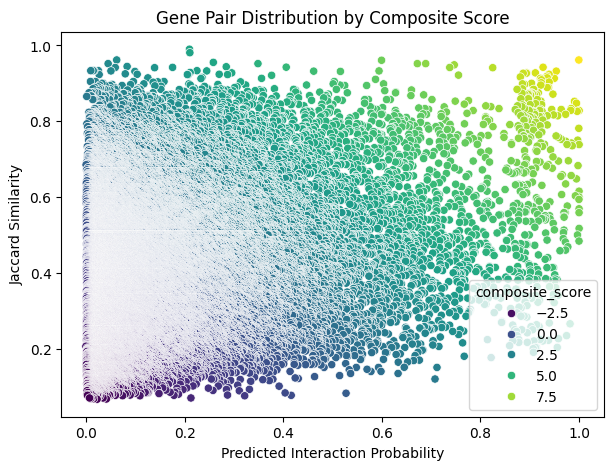

In [50]:
scatter(df_sorted)

In [51]:
df = df_sorted

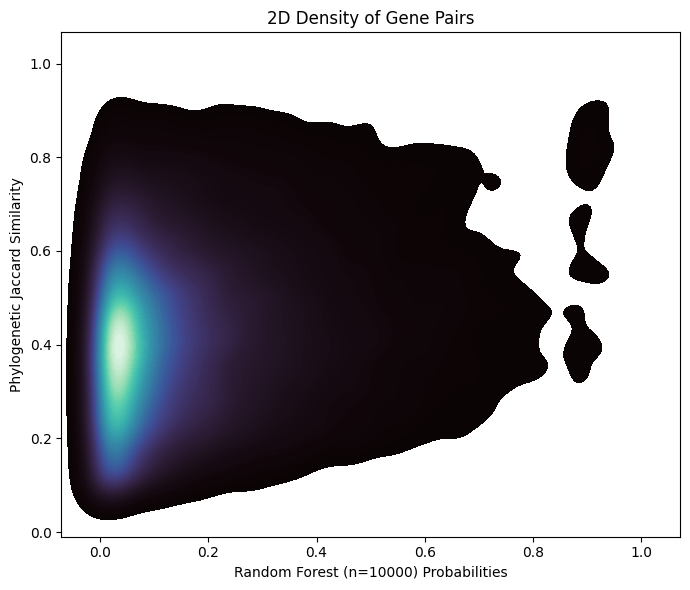

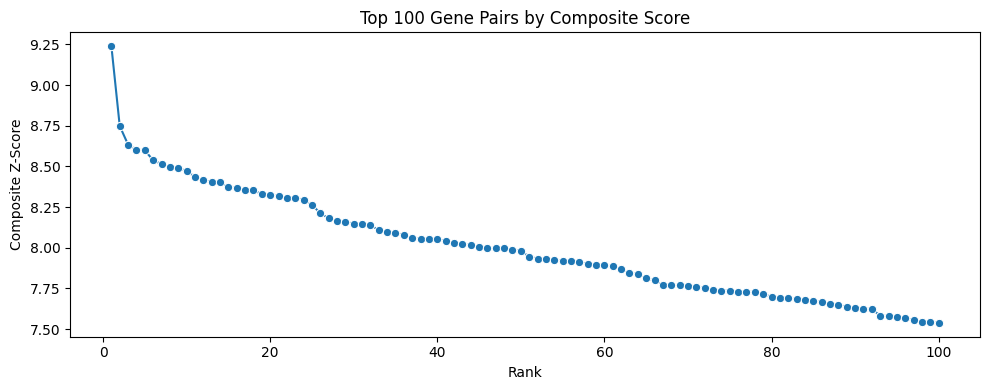

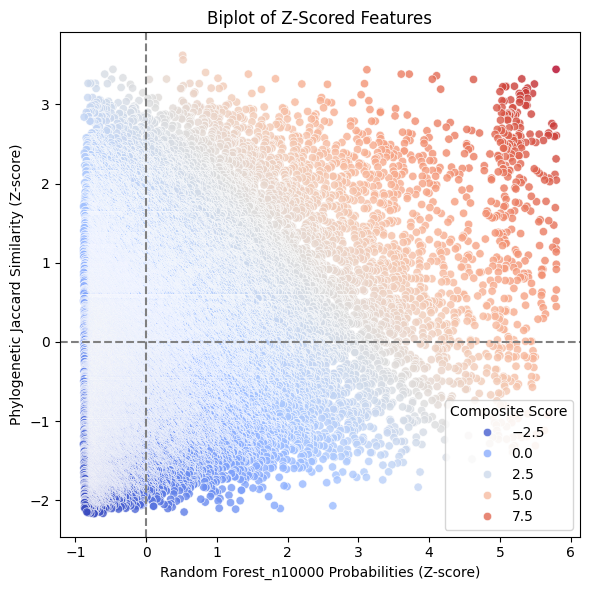

In [56]:
plt.figure(figsize=(7, 6))
sns.kdeplot(
    data=df,
    x='Random Forest_n10000 probabilities',
    y='Phylogenetic_Jaccard_Similarity',
    fill=True,
    cmap='mako',
    levels=100,
    thresh=0.01
)
plt.title("2D Density of Gene Pairs")
plt.xlabel("Random Forest (n=10000) Probabilities")
plt.ylabel("Phylogenetic Jaccard Similarity")
plt.tight_layout()
plt.show()

top_n = 100
df_top = df.sort_values(by='composite_score', ascending=False).head(top_n).copy()
df_top['Rank'] = range(1, top_n + 1)

plt.figure(figsize=(10, 4))
sns.lineplot(data=df_top, x='Rank', y='composite_score', marker='o')
plt.title(f"Top {top_n} Gene Pairs by Composite Score")
plt.xlabel("Rank")
plt.ylabel("Composite Z-Score")
plt.tight_layout()
plt.show()

plt.figure(figsize=(6, 6))
sns.scatterplot(
    data=df,
    x='prob_z',
    y='jaccard_z',
    hue='composite_score',
    palette='coolwarm',
    alpha=0.8
)
plt.axhline(0, color='gray', linestyle='--')
plt.axvline(0, color='gray', linestyle='--')
plt.xlabel("Random Forest_n10000 Probabilities (Z-score)")
plt.ylabel("Phylogenetic Jaccard Similarity (Z-score)")
plt.title("Biplot of Z-Scored Features")
plt.legend(title='Composite Score', loc='best')
plt.tight_layout()
plt.show()


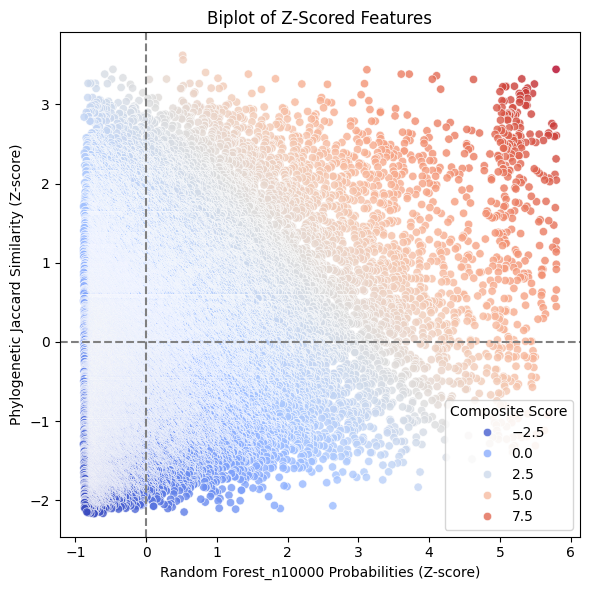

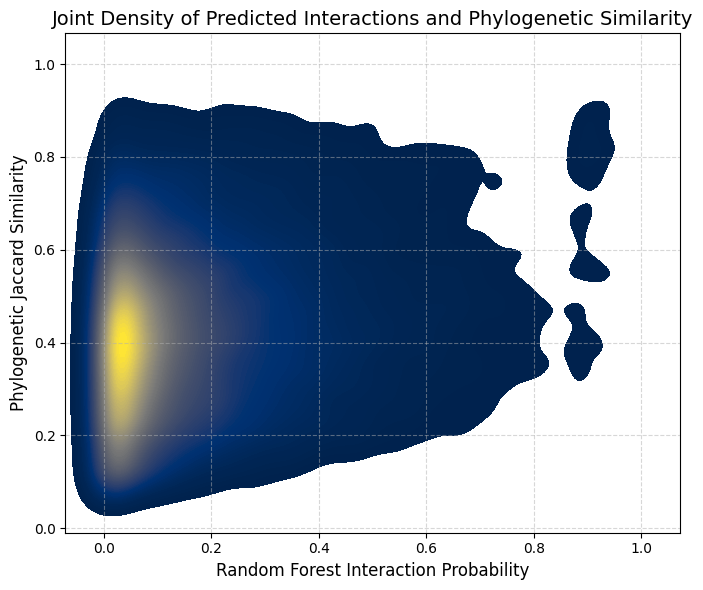

In [57]:
plt.figure(figsize=(7, 6))
sns.kdeplot(
    data=df,
    x='Random Forest_n10000 probabilities',
    y='Phylogenetic_Jaccard_Similarity',
    fill=True,
    cmap='cividis',
    levels=100,
    thresh=0.01
)
plt.title("Joint Density of Predicted Interactions and Phylogenetic Similarity", fontsize=14)
plt.xlabel("Random Forest Interaction Probability", fontsize=12)
plt.ylabel("Phylogenetic Jaccard Similarity", fontsize=12)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.savefig("figure_kde_density.png", dpi=300)
plt.show()


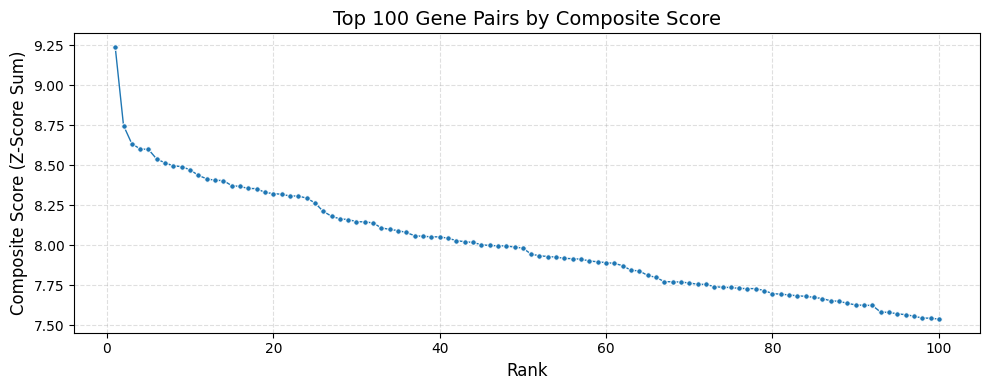

In [58]:
top_n = 100
df_top = df.sort_values(by='composite_score', ascending=False).head(top_n).copy()
df_top['Rank'] = range(1, top_n + 1)

plt.figure(figsize=(10, 4))
sns.lineplot(data=df_top, x='Rank', y='composite_score', marker='o', linewidth=1, markersize=4)
plt.title("Top 100 Gene Pairs by Composite Score", fontsize=14)
plt.xlabel("Rank", fontsize=12)
plt.ylabel("Composite Score (Z-Score Sum)", fontsize=12)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.grid(True, linestyle='--', alpha=0.4)
plt.tight_layout()
plt.savefig("figure_top100_ranking.png", dpi=300)
plt.show()

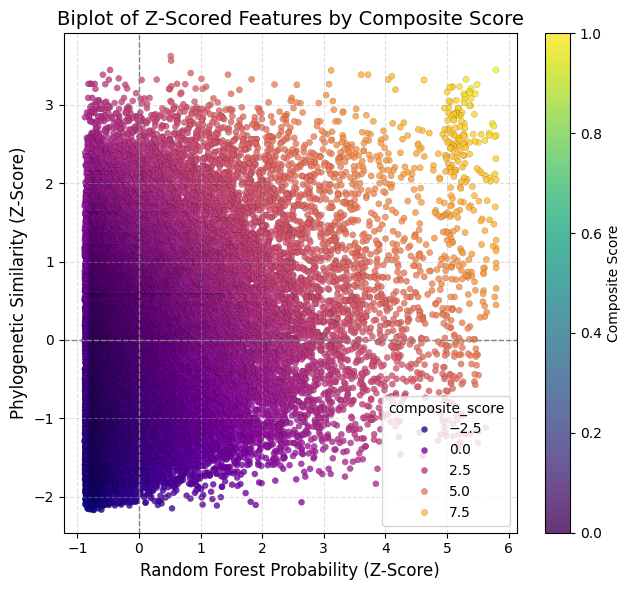

In [59]:
plt.figure(figsize=(6.5, 6))
sc = sns.scatterplot(
    data=df,
    x='prob_z',
    y='jaccard_z',
    hue='composite_score',
    palette='plasma',
    edgecolor='black',
    linewidth=0.1,
    alpha=0.8,
    s=20
)
plt.axhline(0, color='gray', linestyle='--', linewidth=1)
plt.axvline(0, color='gray', linestyle='--', linewidth=1)
plt.xlabel("Random Forest Probability (Z-Score)", fontsize=12)
plt.ylabel("Phylogenetic Similarity (Z-Score)", fontsize=12)
plt.title("Biplot of Z-Scored Features by Composite Score", fontsize=14)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
cbar = plt.colorbar(sc.collections[0], label="Composite Score")
cbar.ax.tick_params(labelsize=10)
plt.grid(True, linestyle='--', alpha=0.4)
plt.tight_layout()
plt.savefig("figure_biplot_zscores.png", dpi=300)
plt.show()

In [60]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

def plot_top_partner_heatmap(top_df, top_n=5):
    """
    Plot a heatmap of the top N partner scores per gene.
    `top_df` is the output of `get_top_gene_partners()`.
    """
    heatmap_data = pd.DataFrame(index=top_df['Gene'])

    for i in range(1, top_n + 1):
        heatmap_data[f'Top_{i}'] = top_df[f'Top_{i}']
        heatmap_data[f'Score_{i}'] = top_df[f'Score_{i}']

    # Convert to a matrix: rows = genes, columns = top partners
    heatmap_matrix = pd.DataFrame(index=top_df['Gene'])

    for i in range(1, top_n + 1):
        heatmap_matrix[top_df[f'Top_{i}']] = top_df[f'Score_{i}']

    # Plot
    plt.figure(figsize=(10, len(top_df)*0.5))
    sns.heatmap(heatmap_matrix.fillna(0), annot=True, fmt=".2f", cmap="viridis")
    plt.title(f"Top {top_n} Partner Scores per Gene")
    plt.xlabel("Top Partners")
    plt.ylabel("Gene")
    plt.tight_layout()
    plt.show()


/tmp/ipykernel_4520/3965313364.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  heatmap_matrix[top_df[f'Top_{i}']] = top_df[f'Score_{i}']
/tmp/ipykernel_4520/3965313364.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  heatmap_matrix[top_df[f'Top_{i}']] = top_df[f'Score_{i}']
/tmp/ipykernel_4520/3965313364.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) inst

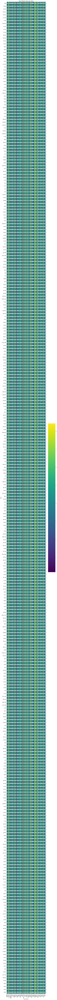

In [62]:
plot_top_partner_heatmap(top_gene_partners)

In [66]:
import networkx as nx
import matplotlib.pyplot as plt

def plot_gene_network(top_df, top_n=5):
    """
    Create a network graph from top N partners.
    Each edge is weighted by the score.
    """
    G = nx.Graph()

    for _, row in top_df.iterrows():
        gene = row['Gene']
        for i in range(1, top_n + 1):
            partner = row[f'Top_{i}']
            score = row[f'Score_{i}']
            if pd.notnull(partner) and pd.notnull(score):
                G.add_edge(gene, partner, weight=score)

    pos = nx.spring_layout(G, k=0.5, seed=42)
    weights = [G[u][v]['weight'] for u, v in G.edges]

    plt.figure(figsize=(10, 8))
    nx.draw_networkx_nodes(G, pos, node_size=500, node_color='skyblue')
    nx.draw_networkx_labels(G, pos, font_size=10)
    nx.draw_networkx_edges(G, pos, width=[w * 3 for w in weights], alpha=0.6)
    plt.title("Gene-Partner Network (Edge Width ∝ Score)")
    plt.axis("off")
    plt.tight_layout()
    plt.show()

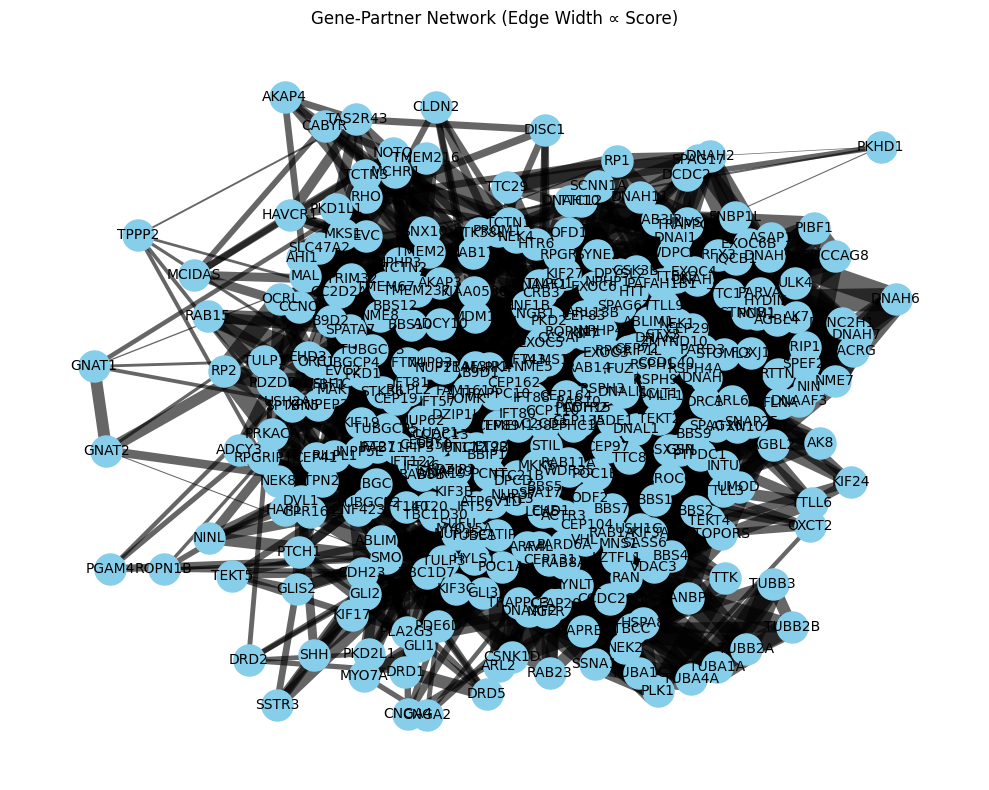

In [67]:
plot_gene_network(top_gene_partners)

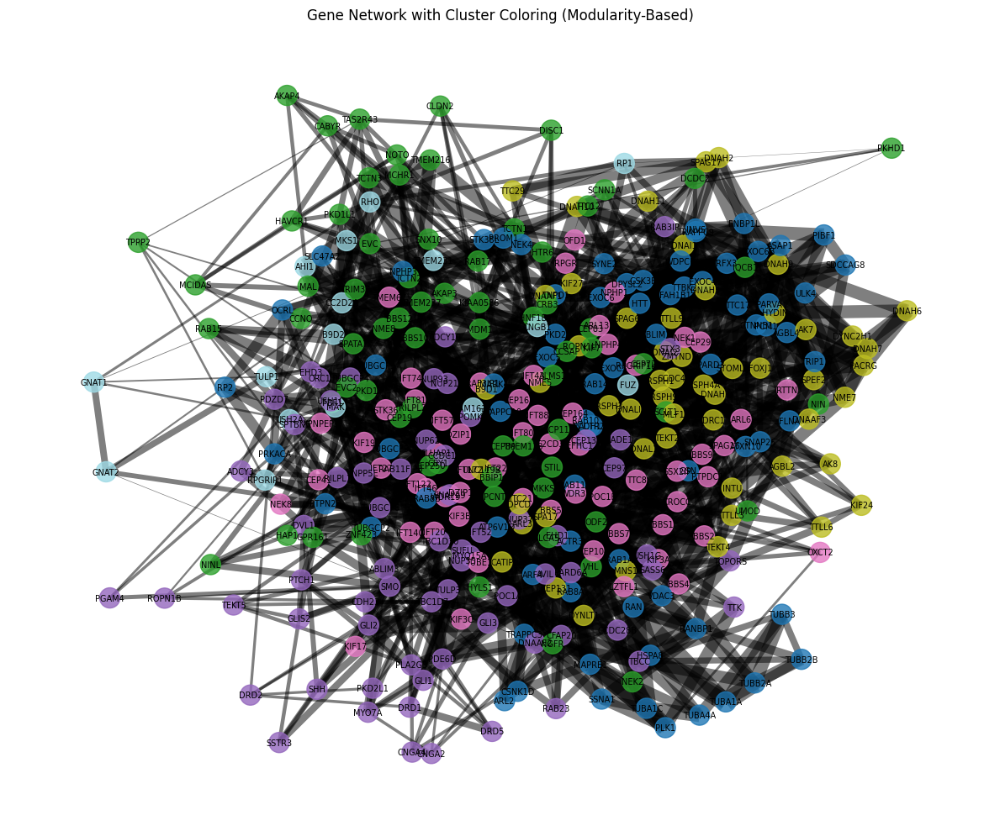

0.5675685510847712


In [79]:
import networkx as nx
import matplotlib.pyplot as plt
import pandas as pd
from networkx.algorithms.community import greedy_modularity_communities

def plot_clustered_gene_network(top_df, top_n=5):
    G = nx.Graph()

    for _, row in top_df.iterrows():
        gene = row['Gene']
        for i in range(1, top_n + 1):
            partner = row[f'Top_{i}']
            score = row[f'Score_{i}']
            if pd.notnull(partner) and pd.notnull(score):
                G.add_edge(gene, partner, weight=score)

    # Apply spring layout for better clustering
    pos = nx.spring_layout(G, k=0.5, seed=42)

    # Detect communities
    communities = list(greedy_modularity_communities(G))
    node_color_map = {}
    for i, community in enumerate(communities):
        for node in community:
            node_color_map[node] = i
    node_colors = [node_color_map[node] for node in G.nodes]

    # Draw
    weights = [G[u][v]['weight'] for u, v in G.edges]
    plt.figure(figsize=(12, 10))
    nx.draw_networkx_nodes(G, pos, node_size=300, cmap=plt.cm.tab20, 
                           node_color=node_colors, alpha=0.8)
    nx.draw_networkx_edges(G, pos, width=[w * 2 for w in weights], alpha=0.5)
    nx.draw_networkx_labels(G, pos, font_size=7)
    plt.title("Gene Network with Cluster Coloring (Modularity-Based)")
    plt.axis("off")
    plt.tight_layout()
    plt.show()

    # For greedy:
    greedy_communities = list(nx.algorithms.community.greedy_modularity_communities(G))
    modularity_greedy = modularity(G_greedy, greedy_communities)

    print(modularity_greedy)

plot_clustered_gene_network(top_gene_partners)

In [76]:
import pandas as pd
import matplotlib.pyplot as plt
import networkx as nx
import igraph as ig
import leidenalg

def nx_to_igraph(G_nx):
    """Convert NetworkX graph to igraph graph."""
    G_ig = ig.Graph(directed=False)
    G_ig.add_vertices(list(G_nx.nodes))
    G_ig.add_edges(list(G_nx.edges))
    return G_ig

def plot_leiden_gene_network(top_df, top_n=5):
    # Build the graph
    G = nx.Graph()
    for _, row in top_df.iterrows():
        gene = row['Gene']
        for i in range(1, top_n + 1):
            partner = row[f'Top_{i}']
            score = row[f'Score_{i}']
            if pd.notnull(partner) and pd.notnull(score):
                G.add_edge(gene, partner, weight=score)

    # Convert to igraph and run Leiden clustering
    G_ig = nx_to_igraph(G)
    partition = leidenalg.find_partition(G_ig, leidenalg.ModularityVertexPartition)

    # Assign cluster labels back to NetworkX nodes
    node_color_map = {}
    for i, community in enumerate(partition):
        for node in community:
            node_color_map[G_ig.vs[node]["name"]] = i
    node_colors = [node_color_map[n] for n in G.nodes]

    # Plotting
    pos = nx.spring_layout(G, k=0.5, seed=42)
    weights = [G[u][v]['weight'] for u, v in G.edges]

    plt.figure(figsize=(12, 10))
    nx.draw_networkx_nodes(G, pos, node_size=300, node_color=node_colors, cmap=plt.cm.tab20, alpha=0.9)
    nx.draw_networkx_edges(G, pos, width=[w * 2 for w in weights], alpha=0.5)
    nx.draw_networkx_labels(G, pos, font_size=7)
    plt.title("Gene Network with Leiden Clustering")
    plt.axis("off")
    plt.tight_layout()
    plt.show()

    print(partition.modularity)


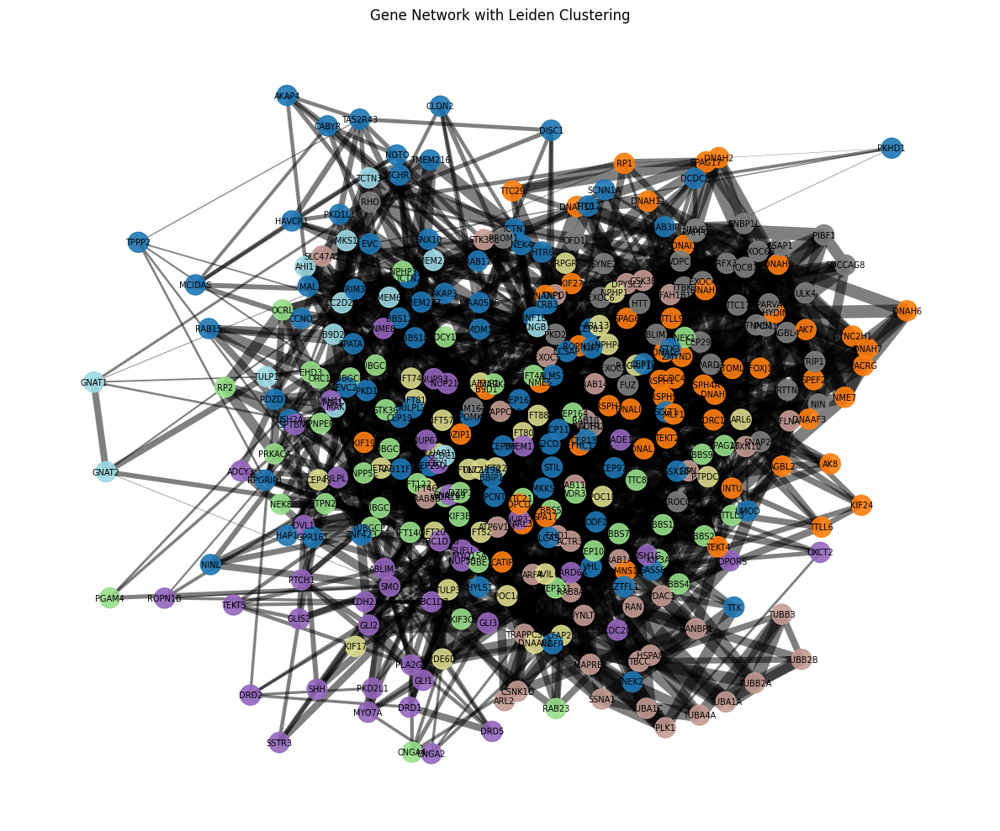

0.578304928332194


In [77]:
plot_leiden_gene_network(top_gene_partners)

In [68]:
import networkx as nx
import matplotlib.pyplot as plt
import igraph as ig
import matplotlib.colors as mcolors

# Make a ListedColormap with your custom palette
from matplotlib.colors import ListedColormap

color_palette = [
    "#E69F00",  # orange
    "#56B4E9",  # sky blue
    "#FF69B4",  # bluish green
    "#00C0A3",  # yellow
    "#D55E00",  # vermillion
    "#D3D3FF",  # reddish purple
    "#32CD32", 
    "#F0E442",
    "#E40078",
    "#FF7F50"]  # grey
#800080
#FF7F50
#B98663
#F0E442
def nx_to_igraph(G_nx):
    G_ig = ig.Graph()
    G_ig.add_vertices(list(G_nx.nodes))
    G_ig.add_edges(list(G_nx.edges))
    return G_ig

def get_node_to_community(partition, G_ig):
    node_to_comm = {}
    for i, community in enumerate(partition):
        for node in community:
            node_name = G_ig.vs[node]["name"]
            node_to_comm[node_name] = i
    return node_to_comm

def get_node_connections_and_weights(G):
    node_connection_dict = {}
    for node in G.nodes:
        connections = []
        for neighbor in G.neighbors(node):
            weight = G[node][neighbor]['weight']
            connections.append((neighbor, weight))
        node_connection_dict[node] = connections
    return node_connection_dict
    
def summarize_clusters_and_connections(G, partition, G_ig):
    node_to_comm = get_node_to_community(partition, G_ig)
    connections = get_node_connections_and_weights(G)

    summary = []
    for node in G.nodes:
        entry = {
            "Gene": node,
            "Cluster": node_to_comm.get(node, -1),
            "Connections": connections[node]
        }
        summary.append(entry)

    return pd.DataFrame(summary)

def plot_walktrap_community(G_nx, layout='spring', title="Ciliary Composite Score Gene Network (Walktrap Clustering)"):
    G_ig = nx_to_igraph(G_nx)

    # Compute Walktrap clustering
    walktrap = G_ig.community_walktrap()
    partition = walktrap.as_clustering()

    # Map colors to cluster IDs
    cluster_map = {}
    for i, community in enumerate(partition):
        for node in community:
            cluster_map[G_ig.vs[node]["name"]] = i
    node_colors = [cluster_map[node] for node in G_nx.nodes]

    # Layout
    pos = nx.spring_layout(G_nx, seed=42) if layout == 'spring' else nx.kamada_kawai_layout(G_nx)
    #pos = nx.kamada_kawai_layout(G_nx)
    #pos = nx.circular_layout(G_nx)
    # Edge weights for width
    weights = [G_nx[u][v]['weight'] for u, v in G_nx.edges]

    # Plot
    plt.figure(figsize=(16, 12)) 
   #plt.figure(figsize=(12, 10))
    #nx.draw_networkx_nodes(G_nx, pos, node_size=300, node_color=node_colors, cmap=plt.cm.tab20, alpha=0.9)

    cmap = ListedColormap(color_palette)
    
    # Normalize the color indices
    node_colors_normalized = [c % len(color_palette) for c in node_colors]
    
    # Plot with friendly palette
    nx.draw_networkx_nodes(
        G_nx,
        pos,
        node_size=300,
        node_color=node_colors_normalized,
        cmap=cmap,
        alpha=0.9
    )
    nx.draw_networkx_edges(G_nx, pos, width=[w * 0.5 for w in weights], alpha=0.5)
    nx.draw_networkx_labels(G_nx, pos, font_size=7)
    plt.title(title)
    plt.axis("off")
    plt.tight_layout()
    plt.savefig("walktrap_network.pdf", format="pdf", dpi=300)  # Also try .png or .svg
    plt.show()

    return partition


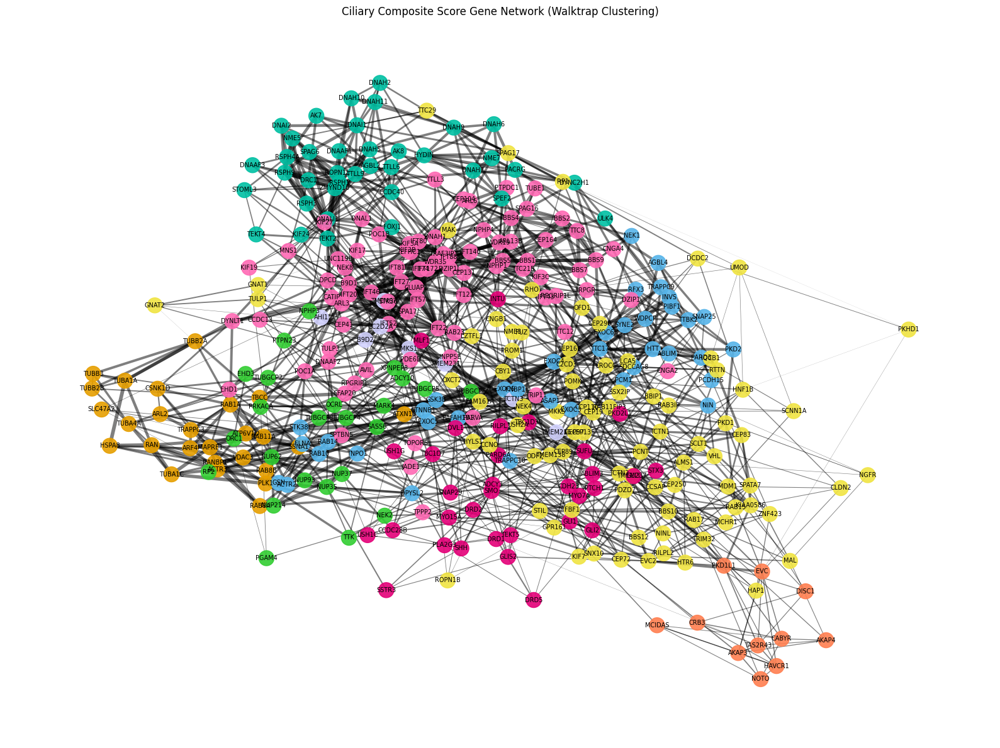

,Gene,Cluster,Connections
0,RAN,0,"[(HSPA8, 9.238972687293243), (TUBA1C, 8.633664..."
1,HSPA8,0,"[(RAN, 9.238972687293243), (TUBA1A, 8.30761071..."
2,TUBA1C,0,"[(RAN, 8.63366435237726), (MAPRE1, 7.917662889..."
3,ACTR3,0,"[(RAN, 7.271484538252391), (HSPA8, 4.109750266..."
4,RANBP1,0,"[(RAN, 7.0094510198600855), (HSPA8, 4.50573968..."
...,...,...,...
337,SLC47A2,0,"[(ATP6V1D, 1.6031064923868257), (STK38L, 1.340..."
338,ROPN1B,6,"[(FAM161A, 1.352522711255033), (TBC1D7, 1.2530..."
339,PKHD1,6,"[(DCDC2, 1.332451917938236), (EVC, 0.502019679..."
340,NGFR,6,"[(MAL, 1.2566353319997443), (BBIP1, 1.11157013..."


In [69]:
# Step 1: Build the graph from top_df
import pandas as pd
import networkx as nx

def build_graph_from_top_df(top_df, top_n=5):
    G = nx.Graph()
    for _, row in top_df.iterrows():
        gene = row['Gene']
        for i in range(1, top_n + 1):
            partner = row.get(f'Top_{i}')
            score = row.get(f'Score_{i}')
            if pd.notnull(partner) and pd.notnull(score):
                G.add_edge(gene, partner, weight=score)
    return G

# Example: construct graph
G = build_graph_from_top_df(top_gene_partners, top_n=5)

# Step 2: Run the Walktrap clustering visualization
partition = plot_walktrap_community(G, layout='spring')

G_ig = nx_to_igraph(G)
summary_df = summarize_clusters_and_connections(G, partition, G_ig)
summary_df

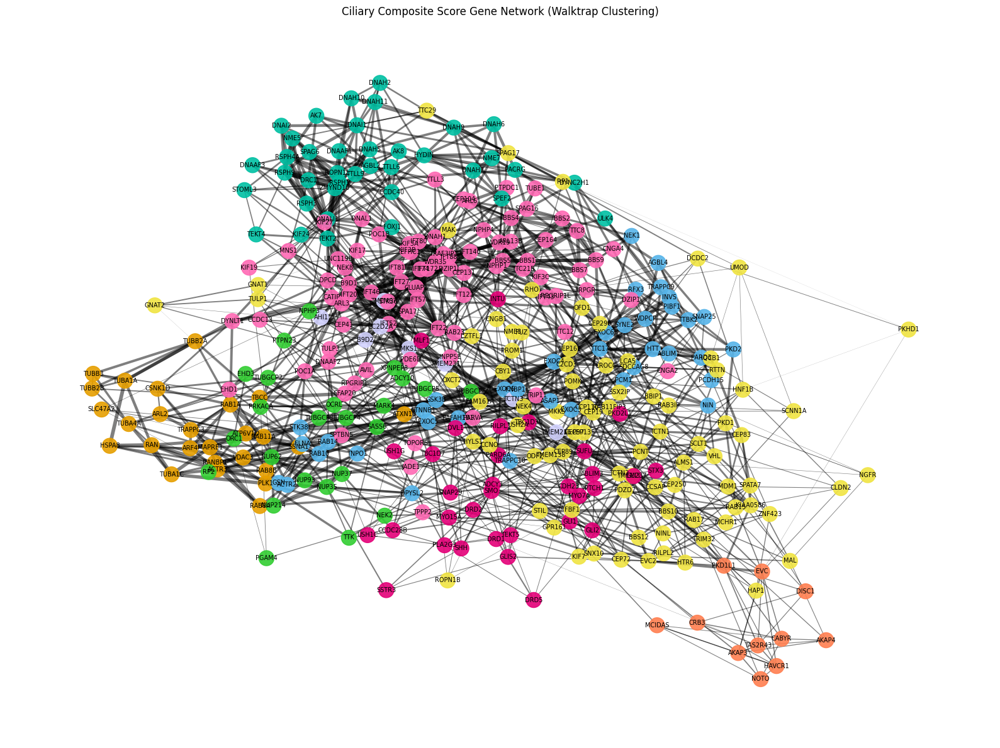

In [66]:
# Step 1: Build the graph from top_df
import pandas as pd
import networkx as nx

def build_graph_from_top_df(top_df, top_n=5):
    G = nx.Graph()
    for _, row in top_df.iterrows():
        gene = row['Gene']
        for i in range(1, top_n + 1):
            partner = row.get(f'Top_{i}')
            score = row.get(f'Score_{i}')
            if pd.notnull(partner) and pd.notnull(score):
                G.add_edge(gene, partner, weight=score)
    return G

# Example: construct graph
G = build_graph_from_top_df(top_gene_partners, top_n=5)

# Step 2: Run the Walktrap clustering visualization
partition = plot_walktrap_community(G, layout='spring')

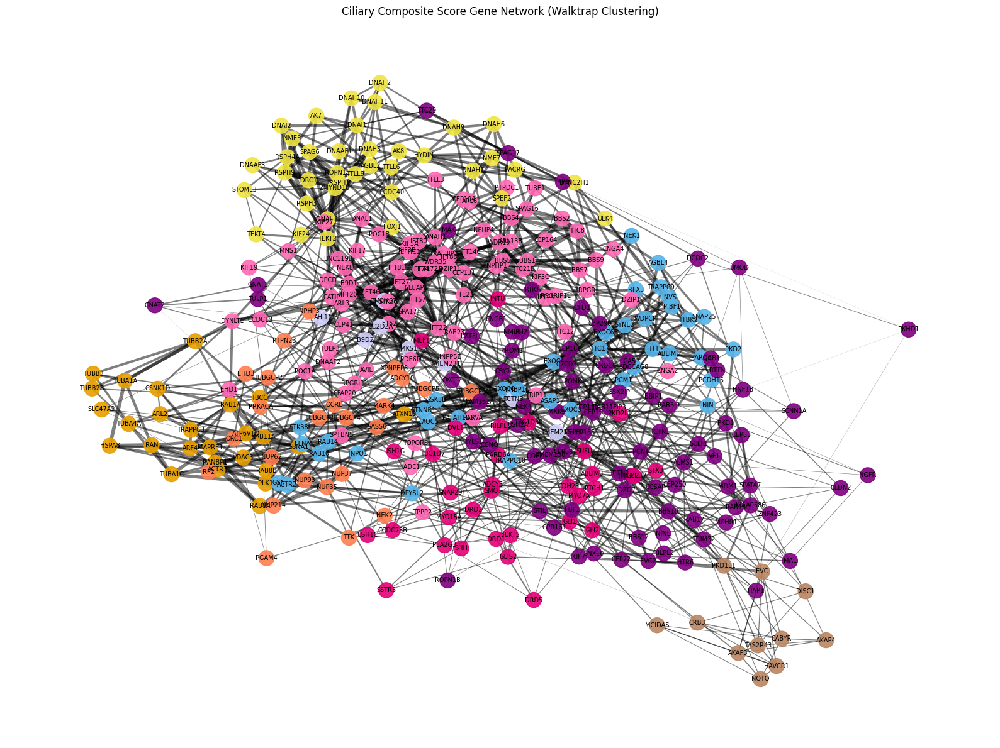

In [54]:
# Step 1: Build the graph from top_df
import pandas as pd
import networkx as nx

def build_graph_from_top_df(top_df, top_n=5):
    G = nx.Graph()
    for _, row in top_df.iterrows():
        gene = row['Gene']
        for i in range(1, top_n + 1):
            partner = row.get(f'Top_{i}')
            score = row.get(f'Score_{i}')
            if pd.notnull(partner) and pd.notnull(score):
                G.add_edge(gene, partner, weight=score)
    return G

# Example: construct graph
G = build_graph_from_top_df(top_gene_partners, top_n=5)

# Step 2: Run the Walktrap clustering visualization
partition = plot_walktrap_community(G, layout='spring')

In [84]:
print(f"Number of Walktrap communities: {len(partition)}")
print(f"Walktrap modularity: {partition.modularity:.4f}")


Number of Walktrap communities: 9
Walktrap modularity: 0.5374


In [149]:
def export_graph_stats(G_nx, G_ig, walktrap_partition, output_csv="gene_network_stats.csv"):
    # Map igraph index → gene name
    igraph_names = G_ig.vs["name"]

    # Build community mapping using igraph node names
    community_map = {}
    for i, community in enumerate(walktrap_partition):
        for ig_idx in community:
            gene = igraph_names[ig_idx]
            community_map[gene] = i

    # Degree (unweighted and weighted)
    degrees = dict(G_nx.degree())
    weighted_degrees = dict(G_nx.degree(weight='weight'))
    betweenness = nx.betweenness_centrality(G_nx, weight='weight', normalized=True)

    # Build dataframe
    records = []
    for node in G_nx.nodes:
        records.append({
            "Gene": node,
            "Community": community_map.get(node),
            "Degree": degrees.get(node, 0),
            "Weighted_Degree": weighted_degrees.get(node, 0.0),
            "Betweenness": betweenness.get(node, 0.0)
        })

    df_stats = pd.DataFrame(records)
    df_stats.to_csv(output_csv, index=False)
    print(f"Exported: {output_csv}")
    return df_stats



In [151]:
# Build the NetworkX graph
G_nx = build_graph_from_top_df(top_gene_partners, top_n=5)

# Convert to igraph and run walktrap
G_ig = nx_to_igraph(G_nx)
walktrap = G_ig.community_walktrap()
walktrap_partition = walktrap.as_clustering()

# Export the gene stats
df_stats = export_graph_stats(G_nx, G_ig, walktrap_partition, output_csv="walktrap_gene_communities.csv")


Exported: walktrap_gene_communities.csv


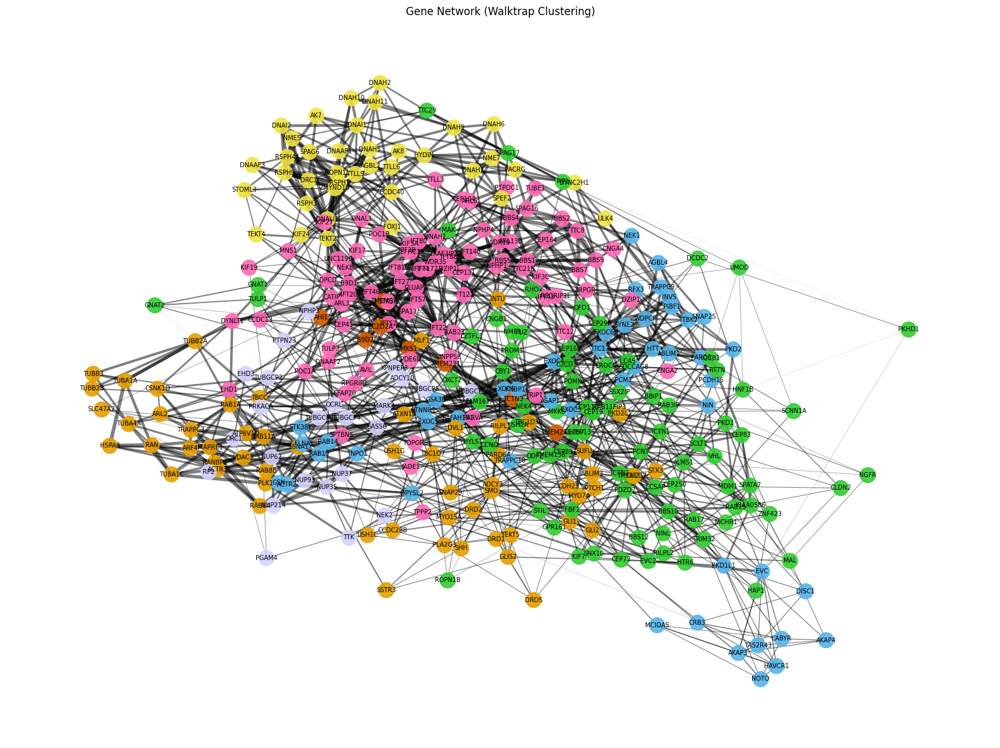

KeyError: 0

In [148]:
walktrap_partition = plot_walktrap_community(G)
df_stats = export_graph_stats(G, walktrap_partition, output_csv="walktrap_gene_communities.csv")


In [154]:
from pyvis.network import Network
import networkx as nx

def export_pyvis_graph(G_nx, partition=None, output_html="walktrap_network_interactive.html"):
    """
    Create and export an interactive PyVis visualization of a NetworkX graph.
    Optionally color nodes by community from a clustering partition.
    """
    net = Network(height="800px", width="100%", notebook=False, bgcolor="#222222", font_color="white")

    # Node community mapping
    community_map = {}
    if partition:
        for i, community in enumerate(partition):
            for node_idx in community:
                community_map[G_nx.nodes[node_idx] if isinstance(node_idx, int) else node_idx] = i

    for node in G_nx.nodes:
        net.add_node(
            node,
            label=node,
            title=f"Gene: {node}<br>Community: {community_map.get(node, 'N/A')}",
            color=f"hsl({(community_map.get(node, 0) * 137) % 360}, 70%, 60%)"
        )

    for u, v, data in G_nx.edges(data=True):
        net.add_edge(u, v, value=data.get("weight", 1.0))

    net.repulsion(node_distance=200, spring_length=200)
    net.show_buttons(filter_=['physics'])
    net.show(output_html)
    print(f"Interactive graph saved as {output_html}")


In [162]:
from pyvis.network import Network

def export_pyvis_graph(G_nx, G_ig, walktrap_partition, output_html="walktrap_network_interactive.html"):
    """
    Create and export an interactive PyVis visualization of a NetworkX graph.
    Uses igraph's walktrap_partition and G_ig to map communities correctly.
    """
    net = Network(height="800px", width="100%", notebook=False)#, bgcolor="#222222", font_color="white")

    # Get igraph node names
    ig_names = G_ig.vs["name"]

    # Map igraph index → gene name → community ID
    community_map = {}
    for i, community in enumerate(walktrap_partition):
        for ig_idx in community:
            node_name = ig_names[ig_idx]
            community_map[node_name] = i

    # Add nodes with community-based color
    for node in G_nx.nodes:
        community = community_map.get(node, 0)
        net.add_node(
            node,
            label=node,
            title=f"Gene: {node}<br>Community: {community}",
            color=f"hsl({(community * 137) % 360}, 70%, 60%)"
        )

    # Add edges with weights
    for u, v, data in G_nx.edges(data=True):
        net.add_edge(u, v, value=data.get("weight", 1.0))

    # Layout and show
    net.repulsion(node_distance=400, spring_length=300)
    net.show_buttons(filter_=['physics'])
    net.write_html(output_html, open_browser=True)
    print(f"Interactive graph saved as {output_html}")


In [168]:
from pyvis.network import Network

def export_pyvis_graph(G_nx, G_ig, walktrap_partition, output_html="walktrap_network_interactive.html"):
    """
    Create and export an interactive PyVis visualization of a NetworkX graph.
    Uses igraph's walktrap_partition and G_ig to map communities correctly.
    """
    net = Network(height="800px", width="100%", notebook=False)

    # Get igraph node names
    ig_names = G_ig.vs["name"]

    # Map igraph index → gene name → community ID
    community_map = {}
    for i, community in enumerate(walktrap_partition):
        for ig_idx in community:
            node_name = ig_names[ig_idx]
            community_map[node_name] = i

    # Add nodes with community-based color and styled font
    for node in G_nx.nodes:
        community = community_map.get(node, 0)
        net.add_node(
            node,
            label=node,
            title=f"<b>Gene:</b> {node}<br><b>Community:</b> {community}",
            color=f"hsl({(community * 137) % 360}, 70%, 60%)",
            font={"size": 50, "bold": True}
        )

    # Add edges with weights
    for u, v, data in G_nx.edges(data=True):
        net.add_edge(u, v, value=data.get("weight", 1.0))

    # Layout and export
    net.repulsion(node_distance=400, spring_length=300)
    net.show_buttons(filter_=['physics'])
    net.write_html(output_html, open_browser=True)
    print(f"Interactive graph saved as {output_html}")


In [169]:

export_pyvis_graph(G_nx, G_ig, walktrap_partition, output_html="walktrap_network_interactive_.html")


Interactive graph saved as walktrap_network_interactive_.html


In [1]:
import pandas as pd
com = pd.read_csv('walktrap_gene_communities.csv')

In [2]:
com[com['Community']==2]

,Gene,Community,Degree,Weighted_Degree,Betweenness
16,CLUAP1,2,18,123.153550,0.001984
17,IFT46,2,13,75.814785,0.009315
18,IFT88,2,16,107.708294,0.005951
19,IFT172,2,12,81.570765,0.001363
20,IFT57,2,10,70.569735,0.000759
...,...,...,...,...,...
319,KIF19,2,5,9.633560,0.028791
321,KIF17,2,5,10.413224,0.012265
333,CNGA4,2,5,7.886896,0.023219
334,CNGA2,2,5,6.575687,0.039486


In [187]:
com[com['Gene']=='BBS9']

,Gene,Community,Degree,Weighted_Degree,Betweenness
65,BBS9,2,10,62.505901,0.00521


In [175]:
com.sort_values(by='Weighted_Degree', ascending=False)

,Gene,Community,Degree,Weighted_Degree,Betweenness
66,IFT22,2,26,135.946556,0.028014
16,CLUAP1,2,18,123.153550,0.001984
22,IFT52,2,19,122.953742,0.003122
39,B9D1,2,19,118.363978,0.007711
37,DNALI1,3,20,111.116011,0.026427
...,...,...,...,...,...
340,NGFR,6,5,4.632245,0.034138
338,ROPN1B,6,4,4.177561,0.022322
332,PGAM4,5,3,4.086489,0.021270
341,TPPP2,2,5,3.690548,0.066224


In [174]:
com.sort_values(by='Degree', ascending=False)

,Gene,Community,Degree,Weighted_Degree,Betweenness
66,IFT22,2,26,135.946556,0.028014
116,SMO,7,23,63.233277,0.066638
37,DNALI1,3,20,111.116011,0.026427
39,B9D1,2,19,118.363978,0.007711
75,TMEM237,6,19,72.146615,0.027549
...,...,...,...,...,...
299,SSTR3,7,4,8.449231,0.003329
309,USH1G,7,4,9.877376,0.006503
244,NEK4,6,4,12.407799,0.004037
243,RP2,5,4,17.100668,0.001328


In [8]:
com.sort_values(by = 'Betweenness', ascending = False)

,Gene,Community,Degree,Weighted_Degree,Betweenness
262,RP1,6,8,16.914547,0.098810
339,PKHD1,6,4,2.256392,0.084078
302,GNAT1,6,5,5.864257,0.079300
331,UMOD,6,5,5.058460,0.068087
305,TULP1,6,7,12.472730,0.068001
...,...,...,...,...,...
115,IFT74,2,5,35.797595,0.000017
182,CEP83,6,7,30.885164,0.000017
51,AHI1,4,5,32.486960,0.000000
163,DNAH6,3,5,29.087665,0.000000


In [10]:
com[com['Community']==6].sort_values(by = 'Betweenness', ascending = False)

,Gene,Community,Degree,Weighted_Degree,Betweenness
262,RP1,6,8,16.914547,0.098810
339,PKHD1,6,4,2.256392,0.084078
302,GNAT1,6,5,5.864257,0.079300
331,UMOD,6,5,5.058460,0.068087
305,TULP1,6,7,12.472730,0.068001
...,...,...,...,...,...
172,RAB15,6,5,15.955288,0.001501
107,CROCC,6,6,22.409695,0.001104
273,GPR161,6,4,12.721115,0.001087
206,BBS10,6,10,36.582038,0.000845


In [40]:
com['WeightedDegreeZ'] = zscore(com['Weighted_Degree'])
com['BetweennessZ'] = zscore(com['Betweenness'])
com['DegreeZ']= zscore(com['Degree'])

In [41]:
com[com['Community']==4]

,Gene,Community,Degree,Weighted_Degree,Betweenness,WeightedDegreeZ,BetweennessZ,DegreeZ
46,CC2D2A,4,13,62.708491,0.018682,1.394535,0.590552,1.659221
47,B9D2,4,9,52.260207,0.001656,0.917469,-0.576529,0.428302
48,TMEM67,4,9,56.913415,0.003467,1.129933,-0.452371,0.428302
50,MKS1,4,7,44.486098,0.000104,0.562504,-0.682949,-0.187157
51,AHI1,4,5,32.486960,0.000000,0.014626,-0.690044,-0.802617
78,TMEM216,4,5,26.081710,0.000483,-0.277836,-0.656935,-0.802617
79,TCTN3,4,6,32.139760,0.000052,-0.001227,-0.686497,-0.494887
81,TMEM231,4,6,35.465069,0.000069,0.150606,-0.685314,-0.494887


In [14]:
com['Community'].value_counts()

Community
6    83
2    82
3    38
1    38
7    32
0    26
5    24
8    11
4     8
Name: count, dtype: int64

In [15]:
com[com['Community']==8]

,Gene,Community,Degree,Weighted_Degree,Betweenness
193,EVC,8,10,24.280329,0.052562
195,AKAP3,8,8,18.129452,0.005434
215,PKD1L1,8,8,23.913688,0.002243
313,CABYR,8,6,11.855550,0.003623
315,TAS2R43,8,8,15.175787,0.046369
316,NOTO,8,5,9.487996,0.001294
317,HAVCR1,8,7,14.301102,0.006089
318,CRB3,8,5,9.270838,0.016405
320,MCIDAS,8,5,8.968189,0.004382
322,AKAP4,8,5,8.802241,0.004658


In [16]:
com[com['Community']==5]

,Gene,Community,Degree,Weighted_Degree,Betweenness
68,TUBGCP2,5,6,28.777858,0.001949
69,TUBGCP3,5,9,42.675793,0.002001
70,TUBGCP5,5,10,40.191331,0.014128
72,TUBGCP4,5,8,30.586953,0.003761
73,ORC1,5,6,19.119595,0.010523
90,NEK2,5,6,17.991893,0.009833
91,TTK,5,5,17.268479,0.001225
98,NUP62,5,9,43.154456,0.011057
99,NUP93,5,6,33.789008,0.001346
100,NUP35,5,11,45.736677,0.030464


In [17]:
com[com['Community']==0]

,Gene,Community,Degree,Weighted_Degree,Betweenness
0,RAN,0,8,55.312205,0.000759
1,HSPA8,0,5,30.220523,0.001501
2,TUBA1C,0,6,41.219445,0.000052
3,ACTR3,0,12,68.630193,0.023840
4,RANBP1,0,7,37.579426,0.000776
5,RAB11A,0,10,62.715677,0.000621
6,TUBA1A,0,6,37.865600,0.000155
7,ARF4,0,7,40.075296,0.000155
8,RAB1A,0,9,58.577790,0.001466
9,ATP6V1D,0,9,50.998125,0.004554


In [18]:
com[com['Community']==7]

,Gene,Community,Degree,Weighted_Degree,Betweenness
105,SUFU,7,9,35.055712,0.006952
106,GLI1,7,7,25.779483,0.002415
108,RILPL1,7,8,26.705408,0.010885
109,TBC1D30,7,11,30.785087,0.019044
111,GLI2,7,6,24.355223,0.003295
112,PARD6A,7,13,39.859420,0.045386
113,MYO15A,7,6,16.721092,0.005710
114,GLI3,7,7,23.753333,0.001898
116,SMO,7,23,63.233277,0.066638
117,ABLIM3,7,6,16.335462,0.005675


In [19]:
com[com['Community']==1]

,Gene,Community,Degree,Weighted_Degree,Betweenness
11,RAB10,1,10,59.506835,0.002501
12,GSK3B,1,10,53.760217,0.002691
23,ACTR2,1,9,50.303099,0.001259
24,RAB14,1,7,35.123891,0.001725
25,DPYSL2,1,6,26.373723,0.002467
52,EXOC4,1,14,87.152806,0.002225
53,EXOC6,1,8,42.786755,0.002225
54,EXOC5,1,9,49.242725,0.004088
55,EXOC3,1,6,30.712127,0.000776
56,EXOC6B,1,7,36.914543,0.004192


In [20]:
com[com['Community']==3]

,Gene,Community,Degree,Weighted_Degree,Betweenness
33,RSPH4A,3,11,70.966901,0.000466
34,RSPH3,3,8,50.124092,0.002070
35,RSPH9,3,12,81.227225,0.000983
36,RSPH1,3,17,107.720411,0.001863
37,DNALI1,3,20,111.116011,0.026427
38,NME5,3,6,37.309611,0.000138
40,ZMYND10,3,13,74.376255,0.003519
83,DRC1,3,9,48.280623,0.002139
84,DNAI2,3,6,36.687155,0.000086
94,SPAG6,3,7,48.682874,0.000000


In [22]:
com[com['Community']==2]

,Gene,Community,Degree,Weighted_Degree,Betweenness
16,CLUAP1,2,18,123.153550,0.001984
17,IFT46,2,13,75.814785,0.009315
18,IFT88,2,16,107.708294,0.005951
19,IFT172,2,12,81.570765,0.001363
20,IFT57,2,10,70.569735,0.000759
...,...,...,...,...,...
319,KIF19,2,5,9.633560,0.028791
321,KIF17,2,5,10.413224,0.012265
333,CNGA4,2,5,7.886896,0.023219
334,CNGA2,2,5,6.575687,0.039486


In [27]:
six = com[com['Community']==6]

In [25]:
342 * 341

116622

In [26]:
116622 /2

58311.0

In [28]:
from scipy.stats import zscore
six['Weighted_Degree_z'] = zscore(six['Weighted_Degree'])

/tmp/ipykernel_133532/3548130995.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  six['Weighted_Degree_z'] = zscore(six['Weighted_Degree'])


In [29]:
six

,Gene,Community,Degree,Weighted_Degree,Betweenness,Weighted_Degree_z
75,TMEM237,6,19,72.146615,0.027549,3.271532
76,TCTN2,6,14,58.223488,0.012230,2.344505
77,TCTN1,6,13,53.584044,0.008263,2.035602
80,TRIM32,6,8,27.508598,0.002174,0.299450
82,EVC2,6,12,42.688155,0.004364,1.310133
...,...,...,...,...,...,...
330,SCNN1A,6,5,7.151297,0.039796,-1.055977
331,UMOD,6,5,5.058460,0.068087,-1.195322
338,ROPN1B,6,4,4.177561,0.022322,-1.253974
339,PKHD1,6,4,2.256392,0.084078,-1.381889


In [30]:
six['Between_z'] = zscore(six['Betweenness'])

/tmp/ipykernel_133532/575186134.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  six['Between_z'] = zscore(six['Betweenness'])


In [32]:
six

,Gene,Community,Degree,Weighted_Degree,Betweenness,Weighted_Degree_z,Between_z
75,TMEM237,6,19,72.146615,0.027549,3.271532,0.644250
76,TCTN2,6,14,58.223488,0.012230,2.344505,-0.143614
77,TCTN1,6,13,53.584044,0.008263,2.035602,-0.347678
80,TRIM32,6,8,27.508598,0.002174,0.299450,-0.660872
82,EVC2,6,12,42.688155,0.004364,1.310133,-0.548193
...,...,...,...,...,...,...,...
330,SCNN1A,6,5,7.151297,0.039796,-1.055977,1.274186
331,UMOD,6,5,5.058460,0.068087,-1.195322,2.729250
338,ROPN1B,6,4,4.177561,0.022322,-1.253974,0.375418
339,PKHD1,6,4,2.256392,0.084078,-1.381889,3.551716


In [33]:
six.sort_values(by='Weighted_Degree_z', ascending=False)

,Gene,Community,Degree,Weighted_Degree,Betweenness,Weighted_Degree_z,Between_z
110,C2CD3,6,18,78.747188,0.012265,3.711011,-0.141840
75,TMEM237,6,19,72.146615,0.027549,3.271532,0.644250
135,CEP290,6,14,65.069897,0.004433,2.800351,-0.544644
76,TCTN2,6,14,58.223488,0.012230,2.344505,-0.143614
77,TCTN1,6,13,53.584044,0.008263,2.035602,-0.347678
...,...,...,...,...,...,...,...
302,GNAT1,6,5,5.864257,0.079300,-1.141671,3.305952
331,UMOD,6,5,5.058460,0.068087,-1.195322,2.729250
340,NGFR,6,5,4.632245,0.034138,-1.223700,0.983173
338,ROPN1B,6,4,4.177561,0.022322,-1.253974,0.375418


In [34]:
six.sort_values(by='Between_z', ascending=False)

,Gene,Community,Degree,Weighted_Degree,Betweenness,Weighted_Degree_z,Between_z
262,RP1,6,8,16.914547,0.098810,-0.405922,4.309414
339,PKHD1,6,4,2.256392,0.084078,-1.381889,3.551716
302,GNAT1,6,5,5.864257,0.079300,-1.141671,3.305952
331,UMOD,6,5,5.058460,0.068087,-1.195322,2.729250
305,TULP1,6,7,12.472730,0.068001,-0.701666,2.724813
...,...,...,...,...,...,...,...
172,RAB15,6,5,15.955288,0.001501,-0.469791,-0.695474
107,CROCC,6,6,22.409695,0.001104,-0.040044,-0.715880
273,GPR161,6,4,12.721115,0.001087,-0.685128,-0.716768
206,BBS10,6,10,36.582038,0.000845,0.903577,-0.729189


In [35]:
six['Degree_z'] = zscore(six['Degree'])

/tmp/ipykernel_133532/3568287495.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  six['Degree_z'] = zscore(six['Degree'])


In [37]:
six

,Gene,Community,Degree,Weighted_Degree,Betweenness,Weighted_Degree_z,Between_z,Degree_z
75,TMEM237,6,19,72.146615,0.027549,3.271532,0.644250,3.872903
76,TCTN2,6,14,58.223488,0.012230,2.344505,-0.143614,2.214229
77,TCTN1,6,13,53.584044,0.008263,2.035602,-0.347678,1.882495
80,TRIM32,6,8,27.508598,0.002174,0.299450,-0.660872,0.223821
82,EVC2,6,12,42.688155,0.004364,1.310133,-0.548193,1.550760
...,...,...,...,...,...,...,...,...
330,SCNN1A,6,5,7.151297,0.039796,-1.055977,1.274186,-0.771383
331,UMOD,6,5,5.058460,0.068087,-1.195322,2.729250,-0.771383
338,ROPN1B,6,4,4.177561,0.022322,-1.253974,0.375418,-1.103118
339,PKHD1,6,4,2.256392,0.084078,-1.381889,3.551716,-1.103118


In [42]:
com['Community'].value_counts()

Community
6    83
2    82
3    38
1    38
7    32
0    26
5    24
8    11
4     8
Name: count, dtype: int64

In [72]:
WALKTRAP_SUMMARY = summary_df.merge(com, on = 'Gene').drop(columns=['Cluster'])

In [73]:
WALKTRAP_SUMMARY.to_csv('walktrap_cilia_summary.csv',index=False)

In [75]:
WALKTRAP_SUMMARY[WALKTRAP_SUMMARY['Community']==4]

,Gene,Connections,Community,Degree,Weighted_Degree,Betweenness,WeightedDegreeZ,BetweennessZ,DegreeZ
46,CC2D2A,"[(B9D1, 8.403878731099317), (TMEM67, 7.8395237...",4,13,62.708491,0.018682,1.394535,0.590552,1.659221
47,B9D2,"[(B9D1, 8.160432260859587), (CC2D2A, 7.5659716...",4,9,52.260207,0.001656,0.917469,-0.576529,0.428302
48,TMEM67,"[(B9D1, 7.74128551543009), (CC2D2A, 7.83952378...",4,9,56.913415,0.003467,1.129933,-0.452371,0.428302
50,MKS1,"[(CC2D2A, 6.663106333403617), (B9D2, 6.4993660...",4,7,44.486098,0.000104,0.562504,-0.682949,-0.187157
51,AHI1,"[(CC2D2A, 6.381573739720354), (B9D2, 6.2558419...",4,5,32.486960,0.000000,0.014626,-0.690044,-0.802617
78,TMEM216,"[(TMEM237, 5.671558121903909), (TCTN2, 5.18361...",4,5,26.081710,0.000483,-0.277836,-0.656935,-0.802617
79,TCTN3,"[(TMEM237, 5.370707610128888), (TCTN1, 5.44290...",4,6,32.139760,0.000052,-0.001227,-0.686497,-0.494887
81,TMEM231,"[(TCTN2, 5.222280218535789), (B9D1, 6.43759800...",4,6,35.465069,0.000069,0.150606,-0.685314,-0.494887


array([[<Axes: title={'center': 'WeightedDegreeZ'}>]], dtype=object)

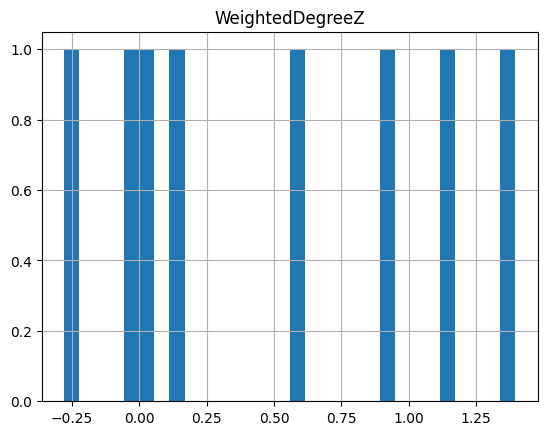

In [77]:
WALKTRAP_SUMMARY[WALKTRAP_SUMMARY['Community']==4].hist('WeightedDegreeZ', bins=30)

In [79]:
WALKTRAP_SUMMARY[WALKTRAP_SUMMARY['Community']==6].sort_values(by = 'BetweennessZ',ascending=False)

,Gene,Connections,Community,Degree,Weighted_Degree,Betweenness,WeightedDegreeZ,BetweennessZ,DegreeZ
262,RP1,"[(TTC29, 3.8370430332670713), (SPAG17, 3.72276...",6,8,16.914547,0.098810,-0.696407,6.083044,0.120572
339,PKHD1,"[(DCDC2, 1.332451917938236), (EVC, 0.502019679...",6,4,2.256392,0.084078,-1.365696,5.073229,-1.110346
302,GNAT1,"[(GNAT2, 2.861585454005572), (RHO, 1.091273984...",6,5,5.864257,0.079300,-1.200962,4.745690,-0.802617
331,UMOD,"[(SCNN1A, 1.0168476399517583), (RP1, 1.2587198...",6,5,5.058460,0.068087,-1.237754,3.977096,-0.802617
305,TULP1,"[(GNAT1, 0.6864263974352585), (GNAT2, 2.688945...",6,7,12.472730,0.068001,-0.899220,3.971184,-0.187157
...,...,...,...,...,...,...,...,...,...
172,RAB15,"[(PDZD7, 2.989050545170553), (PKD1, 4.46174636...",6,5,15.955288,0.001501,-0.740207,-0.587171,-0.802617
107,CROCC,"[(SUFU, 5.138038647968898), (FUZ, 4.0534345159...",6,6,22.409695,0.001104,-0.445500,-0.614367,-0.494887
273,GPR161,"[(SMO, 3.688597406696516), (EVC2, 3.1892561311...",6,4,12.721115,0.001087,-0.887879,-0.615549,-1.110346
206,BBS10,"[(STIL, 5.418507866354926), (ALMS1, 4.96314245...",6,10,36.582038,0.000845,0.201607,-0.632104,0.736032


In [83]:
WALKTRAP_SUMMARY[WALKTRAP_SUMMARY['Gene']=='RP1']['Connections'].to_list()[0]

[('TTC29', 3.8370430332670713),
 ('SPAG17', 3.722765226867004),
 ('SYNE2', 3.101889883558114),
 ('HYDIN', 2.757283063303238),
 ('GNAT1', 0.3125551300781151),
 ('RHO', 1.7589021912569216),
 ('PKHD1', 0.1653887231477196),
 ('UMOD', 1.2587198423560493)]

In [84]:
WALKTRAP_SUMMARY[WALKTRAP_SUMMARY['Gene']=='GNAT1']['Connections'].to_list()[0]

[('GNAT2', 2.861585454005572),
 ('RHO', 1.0912739847956576),
 ('USH2A', 0.9124157583942316),
 ('TULP1', 0.6864263974352585),
 ('RP1', 0.3125551300781151)]

In [85]:
WALKTRAP_SUMMARY[WALKTRAP_SUMMARY['Community']==6].sort_values(by = 'WeightedDegreeZ',ascending=False)

,Gene,Connections,Community,Degree,Weighted_Degree,Betweenness,WeightedDegreeZ,BetweennessZ,DegreeZ
110,C2CD3,"[(SUFU, 4.007613289062034), (CEP290, 5.8232200...",6,18,78.747188,0.012265,2.126859,0.150680,3.197869
75,TMEM237,"[(TCTN2, 7.756117098555231), (TCTN1, 6.5707824...",6,19,72.146615,0.027549,1.825478,1.198333,3.505599
135,CEP290,"[(RPGRIP1L, 4.694309991248972), (PCM1, 5.62541...",6,14,65.069897,0.004433,1.502357,-0.386154,1.966951
76,TCTN2,"[(TMEM237, 7.756117098555231), (TCTN1, 7.00221...",6,14,58.223488,0.012230,1.189751,0.148315,1.966951
77,TCTN1,"[(TMEM237, 6.570782424246896), (TCTN2, 7.00221...",6,13,53.584044,0.008263,0.977915,-0.123649,1.659221
...,...,...,...,...,...,...,...,...,...
302,GNAT1,"[(GNAT2, 2.861585454005572), (RHO, 1.091273984...",6,5,5.864257,0.079300,-1.200962,4.745690,-0.802617
331,UMOD,"[(SCNN1A, 1.0168476399517583), (RP1, 1.2587198...",6,5,5.058460,0.068087,-1.237754,3.977096,-0.802617
340,NGFR,"[(MAL, 1.2566353319997443), (BBIP1, 1.11157013...",6,5,4.632245,0.034138,-1.257215,1.650029,-0.802617
338,ROPN1B,"[(FAM161A, 1.352522711255033), (TBC1D7, 1.2530...",6,4,4.177561,0.022322,-1.277976,0.840049,-1.110346


In [86]:
WALKTRAP_SUMMARY[WALKTRAP_SUMMARY['Community']==6].sort_values(by = 'Weighted_Degree',ascending=False)

,Gene,Connections,Community,Degree,Weighted_Degree,Betweenness,WeightedDegreeZ,BetweennessZ,DegreeZ
110,C2CD3,"[(SUFU, 4.007613289062034), (CEP290, 5.8232200...",6,18,78.747188,0.012265,2.126859,0.150680,3.197869
75,TMEM237,"[(TCTN2, 7.756117098555231), (TCTN1, 6.5707824...",6,19,72.146615,0.027549,1.825478,1.198333,3.505599
135,CEP290,"[(RPGRIP1L, 4.694309991248972), (PCM1, 5.62541...",6,14,65.069897,0.004433,1.502357,-0.386154,1.966951
76,TCTN2,"[(TMEM237, 7.756117098555231), (TCTN1, 7.00221...",6,14,58.223488,0.012230,1.189751,0.148315,1.966951
77,TCTN1,"[(TMEM237, 6.570782424246896), (TCTN2, 7.00221...",6,13,53.584044,0.008263,0.977915,-0.123649,1.659221
...,...,...,...,...,...,...,...,...,...
302,GNAT1,"[(GNAT2, 2.861585454005572), (RHO, 1.091273984...",6,5,5.864257,0.079300,-1.200962,4.745690,-0.802617
331,UMOD,"[(SCNN1A, 1.0168476399517583), (RP1, 1.2587198...",6,5,5.058460,0.068087,-1.237754,3.977096,-0.802617
340,NGFR,"[(MAL, 1.2566353319997443), (BBIP1, 1.11157013...",6,5,4.632245,0.034138,-1.257215,1.650029,-0.802617
338,ROPN1B,"[(FAM161A, 1.352522711255033), (TBC1D7, 1.2530...",6,4,4.177561,0.022322,-1.277976,0.840049,-1.110346


In [87]:
WALKTRAP_SUMMARY[WALKTRAP_SUMMARY['Gene']=='C2CD3']['Connections'].to_list()[0]

[('SUFU', 4.007613289062034),
 ('CEP290', 5.823220002682165),
 ('PCNT', 6.0537092952277565),
 ('TUBGCP6', 5.655454959689964),
 ('TTC21B', 5.209513588258366),
 ('BBS7', 5.177720368177465),
 ('CEP97', 5.170930660026192),
 ('ALMS1', 5.089850506533519),
 ('CEP250', 3.549045248386776),
 ('CEP162', 4.298607870650475),
 ('XPNPEP3', 4.491741737476606),
 ('POMK', 4.442585983594267),
 ('DNAH1', 3.910653433761538),
 ('RTTN', 2.908717508720258),
 ('DZIP1L', 3.2325182883704406),
 ('LZTFL1', 3.274332876114149),
 ('NEK4', 3.011288077658342),
 ('SSX2IP', 3.4396841659837314)]